In [1]:
#OMNS
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os, glob, time
import cv2
import pickle
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
from skimage.feature import hog
from scipy.ndimage.measurements import label

# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

%matplotlib inline

#######  Parameters/Controls ##############################################
DBG_PRINT = 0
DBG_SAVE_IMAGES = 2

data_folder = './train_data/*/*/*/'
test_img_folder = './test_images/'

######################################################################### 
print ("***Done***")  


***Done***


C:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [8]:
'''
### Image transofrmations & scale (Data_format)

mpimg.imread(jpeg) -> RGB (0, 255) -> cv2.cvtColor() -> (0, 255)
cv2.imread(jpeg)   -> BGR (0, 255) -> cv2.cvtColor() -> (0, 255)

mpimg.imread(png)  -> RGB (0, 1)   -> cv2.cvtColor() -> (0, 255)
cv2.imread(png)    -> BGR (0, 255) -> cv2.cvtColor() -> (0, 255)

feature_image: unit8

Spatial Features: uint8
Color Hist Features: int64
HOG_features: float64
Img_Features[0:2]: uint8 int64 float64 (Spatial, Color Hist, HOG)

'''
################# DEFINE FUNCTIONS USED IN THE PROJECT ###########################

### Function to plot images
def plot_images(img_list, cmap_gray, title_list, top=0.8, right=1.0, imgs_per_row=2, \
                figsize=(24,9), fontsize=20, fname='P5_output_image'):
    nrows = -(-len(img_list)//imgs_per_row) 
    ncols = imgs_per_row
    f, axes = plt.subplots(nrows, ncols, figsize=figsize)
    f.tight_layout()
    #plt.subplots_adjust(left=0., right=right, top=top, bottom=0., hspace=0.05)
    #plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0., hspace=0.25, wspace=0.1)
    idx = 0
    if len(img_list) > 1: axes_array = axes.flatten()
    else: axes_array = [axes]
    for axis in axes_array:
        if cmap_gray[idx]==1:  axis.imshow(img_list[idx], cmap='gray')
        elif cmap_gray[idx]==2: axis.imshow(img_list[idx], cmap='hot')
        else: axis.imshow(img_list[idx])
        img_title ="'"+title_list[idx]+"'"  
        axis.set_title(img_title, fontsize=fontsize)
        idx=idx+1
    if (DBG_SAVE_IMAGES > 1):
        filename = fname + '.jpg'
        plt.savefig(filename)

### Function to convert color
def convert_color(img, conv='RGB2YUV'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)


# Define a function to return HOG features and visualization
### While using YUV, set transform_sqrt=False
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                    pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    if DBG_PRINT == 1:
        print('Spatial features:', features.dtype)
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


### Plot the hog feature images
def plot_hog_features (img_file, color_space='RGB',
                        orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        ):
    # Read in the image
    image = mpimg.imread(img_file)
    # apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)      
    fimg = feature_image[:,:,hog_channel]
    features, hog_img = get_hog_features(fimg, 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=True, feature_vec=True)
    return features, feature_image, hog_img


### Extract ALL features from images (Spatial, Color hist, HOG)
def extract_all_features(imgs, color_space='RGB', spatial_size=(32, 32),
                          hist_bins=32, orient=9, 
                          pix_per_cell=8, cell_per_block=2, hog_channel=0,
                          spatial_feat=True, hist_feat=True, hog_feat=True):   
    # Create a list to append feature vectors
    features = []
    # Iterate through the list of images
    for img_file in imgs:
        # Create a list for iamge features
        img_features = []
        # Read in each one by one
        img = mpimg.imread(img_file)
        # Apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(img)             
        #3) Compute spatial features if flag is set
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            #4) Append Spatial features to list
            img_features.append(spatial_features)
        #5) Compute histogram features if flag is set
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            #6) Append Color features to list
            img_features.append(hist_features)
        #7) Compute HOG features if flag is set
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))      
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                           pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            #8) Append HOG features to list
            img_features.append(hog_features)
        features.append(np.concatenate(img_features))
    #9) Return concatenated array of features
    return features


# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list


# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

### Extract ALL features from Single Image
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
        #print('Spatial:', spatial_features.dtype)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
        #print('Color Hist:', hist_features.dtype)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)
        #print('HOG:', hog_features.dtype)

    #9) Return concatenated array of features
    #print('Img_Features:', img_features[0].dtype,
    #                        img_features[1].dtype, img_features[2].dtype)
    return np.concatenate(img_features)


# Define a function to pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, cspace, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, \
              cell_per_block, spatial_size, hist_bins):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    
    # apply color conversion if other than 'RGB'
    #ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YUV')
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(image)   
        
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    #print('nblocks_per_window: ', nblocks_per_window)
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    on_windows = []
    bboxes = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)) 
            test_prediction = svc.predict(test_features)
            
            # Enumerate the bounding boxes
            xbox_left = np.int(xleft*scale)
            ytop_draw = np.int(ytop*scale)
            win_draw = np.int(window*scale)
            bboxes.append(((int(xbox_left), int(ytop_draw+ystart)),(int(xbox_left+win_draw),int(ytop_draw+win_draw+ystart))))
            if test_prediction == 1:
                #xbox_left = np.int(xleft*scale)
                #ytop_draw = np.int(ytop*scale)
                #win_draw = np.int(window*scale)
                #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                on_windows.append(((int(xbox_left), int(ytop_draw+ystart)),(int(xbox_left+win_draw),int(ytop_draw+win_draw+ystart))))
     
    #print ('1 in_windows: ', on_windows)
    return on_windows, bboxes

### Multi-scale sliding window approach
def sliding_windows_multiscale (img, cspace, scale_list, svc, X_scaler, orient, \
                                pix_per_cell, cell_per_block, spatial_size, hist_bins):
    hot_windows = []
    search_windows = []
    for i in range(0, len(scale_list), 2):
        scale = scale_list[i]
        (ystart, ystop) = scale_list[i+1]
        #print ('scale_window: ', scale, scale_list[i+1])
        on_windows, bboxes = find_cars(img, cspace, ystart, ystop, scale, svc, X_scaler, \
                               orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        #print ('on_windows: ', on_windows)
        hot_windows.extend(on_windows)
        search_windows.extend(bboxes)

    return hot_windows, search_windows

### Heat to map a list of bounding boxes
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes

def remove_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] -= 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img


print ('*** Done ***')

*** Done ***


Training Data stats: 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32
float32
***Done***


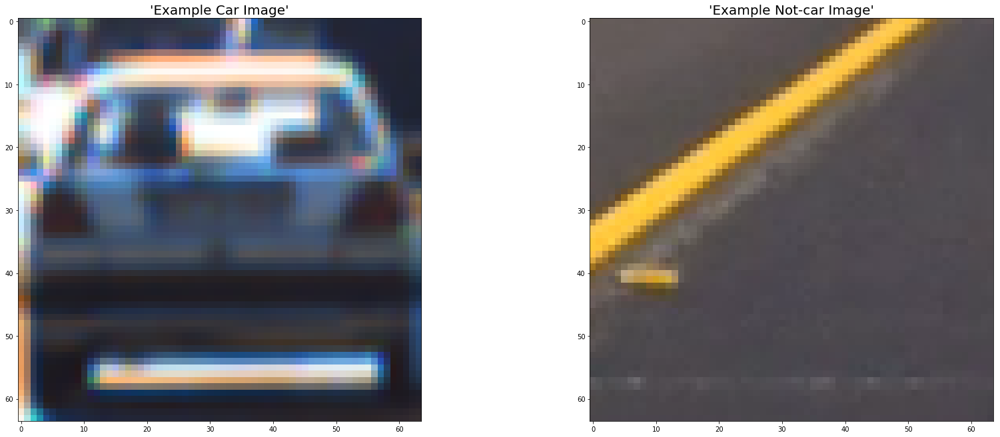

In [3]:
##########   Data lookup to create Car & NotCar lists  ############################

# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    image = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = image.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = image.dtype
    # Return data_dict
    return data_dict


train_images = glob.glob(data_folder+'*.png')

cars = []
notcars = []

for image in train_images:
    if 'non-vehicles' in image:
        notcars.append(image)
    else:
        cars.append(image)

data_info = data_look(cars, notcars)

print('Training Data stats:', data_info["n_cars"], ' cars and', data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', data_info["data_type"])
# Plot a random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

print (car_image.dtype)
# Plot the examples
img_list =[car_image, notcar_image]
title_list = ['Example Car Image', 'Example Not-car Image']
cmap_gray =[0,0]
plot_images(img_list, cmap_gray, title_list, imgs_per_row=2, figsize=(24,9), right = 0.5, \
            fname='car_not_car')

print ("***Done***")  



car_ind:  7988 notcar_ind:  8663


C:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


***Done ***


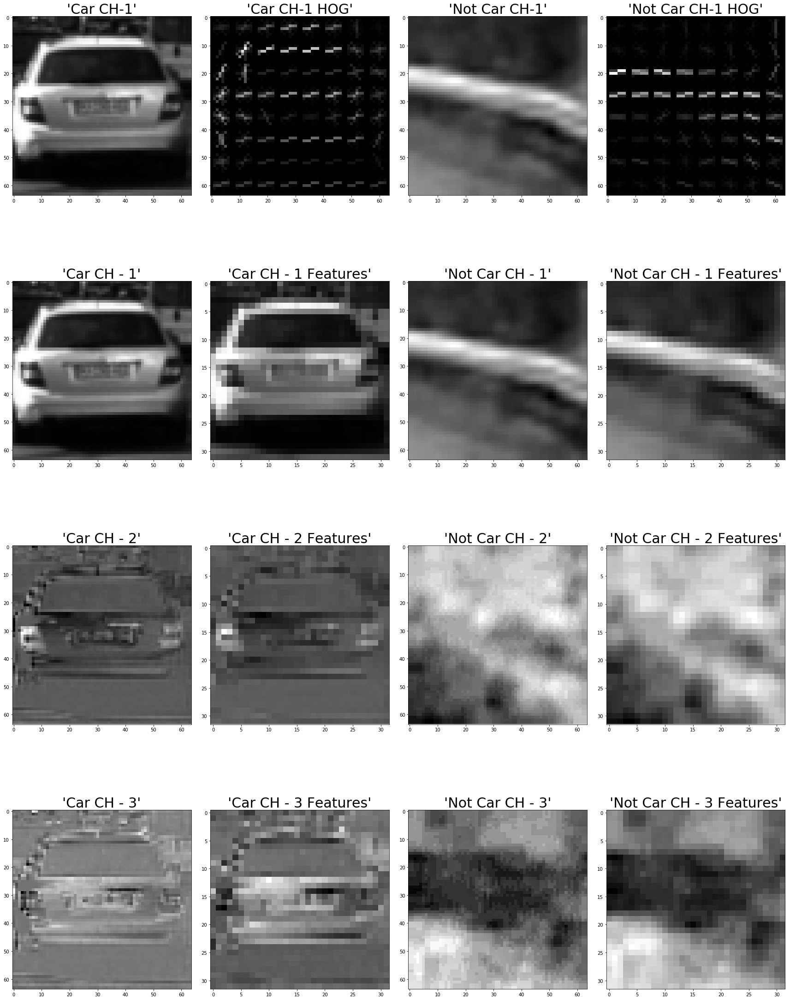

In [4]:
# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))
# Read in the image
image = mpimg.imread(cars[ind])  
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Call  function with vis=True to see an image output
color_space = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
#y_start_stop = [450, None] # Min and max in y to search in slide_window()

#t=time.time()
img_list = []
cmap_gray = []
title_list = []

# Plot a random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

print ('car_ind: ', car_ind, 'notcar_ind: ', notcar_ind)
# Read in car / not-car images
imgs = []
imgs.append(cars[car_ind])
imgs.append(notcars[notcar_ind])
        

fimgs = []
for idx,img_file in enumerate(imgs):
    # Extract HOG features 
    features, feature_img, hog_img = plot_hog_features(img_file, color_space=color_space,
                                   orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0)
    img_list.append(np.copy(feature_img[:,:,0]))
    cmap_gray.append(1)
    if idx == 0:
        title_list.append('Car CH-1')
    else:
        title_list.append('Not Car CH-1')
    img_list.append(np.copy(hog_img))
    cmap_gray.append(1)
    if idx == 0:
        title_list.append('Car CH-1 HOG')
    else:
        title_list.append('Not Car CH-1 HOG')
    fimgs.append(feature_img)
    
# Create the Feature images for each color channel
for channel in range(fimgs[0].shape[2]):
    for idx,fimg in enumerate(fimgs):  
        # Create the Feature Images
        img_list.append(np.copy(fimg[:,:,channel]))
        cmap_gray.append(1)
        if idx == 0: title = 'Car CH - ' + str(channel+1)
        else: title = 'Not Car CH - ' + str(channel+1)
        title_list.append(title)
        # Append the Feature images
        img_list.append(np.copy(cv2.resize(fimg[:,:,channel], spatial_size)))
        cmap_gray.append(1)
        if idx == 0: title = 'Car CH - ' + str(channel+1) + ' Features'
        else: title = 'Not Car CH - ' + str(channel+1) + ' Features'
        title_list.append(title)
 
# Plot the Channel/Feature images
plot_images(img_list, cmap_gray, title_list, top=0.8, right=1.0, \
            imgs_per_row=4, figsize=(24,32), fontsize=30, fname='HOG_example')

print ('***Done ***')

In [5]:
###### Training SVM Clasifier #####################################################
### Parameter features
# Call  function with vis=True to see an image output
color_space = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG eatures on or off

In [84]:
###### Training SVM Clasifier #####################################################

# Reduce the sample size because HOG features are slow to compute
# The quiz evaluator times out after 13s of CPU time
DBG_LIMIT_SAMPLE_SIZE = False
if DBG_LIMIT_SAMPLE_SIZE == True:
    sample_size = 500
    cars = cars[0:sample_size]
    notcars = notcars[0:sample_size]
    
print ('# of Car samples: ', len(cars), '# of NotCar Samples: ', len(notcars))
    
t=time.time()
car_features = extract_all_features(cars, color_space=color_space, spatial_size=spatial_size,
                          hist_bins=hist_bins, orient=orient, 
                          pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                          spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)  

notcar_features = extract_all_features(notcars, color_space=color_space, spatial_size=spatial_size,
                          hist_bins=hist_bins, orient=orient, 
                          pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                          spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

# Save the Trained classifier
print('\nSaving the SVC Training classifier data to svc_classifier.p')
svc_data = [svc, X_scaler]
pickle.dump(svc_data, open("svc_classifier.p", "wb"))


print ('*** Done***')

# of Car samples:  8792 # of NotCar Samples:  8968
228.79 Seconds to extract HOG features...
Using: 11 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 9636
12.76 Seconds to train SVC...
Test Accuracy of SVC =  0.9907
My SVC predicts:  [ 0.  1.  1.  1.  1.  0.  1.  0.  1.  0.]
For these 10 labels:  [ 0.  1.  1.  1.  1.  0.  1.  0.  1.  0.]
0.02 Seconds to predict 10 labels with SVC

Saving the SVC Training classifier data to svc_classifier.p
*** Done***


Scale_List:  [1.0, (400, 480), 1.0, (420, 500), 1.5, (400, 520), 1.5, (440, 560), 2.0, (400, 560), 2.0, (480, 640), 3.0, (380, 620), 3.0, (460, 700)]
[1.0, (400, 480), 1.0, (420, 500), 1.5, (400, 520), 1.5, (440, 560), 2.0, (400, 560), 2.0, (480, 640), 3.0, (380, 620), 3.0, (460, 700)]
*** Loading the SVC Training classifier data to svc_classifier


C:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


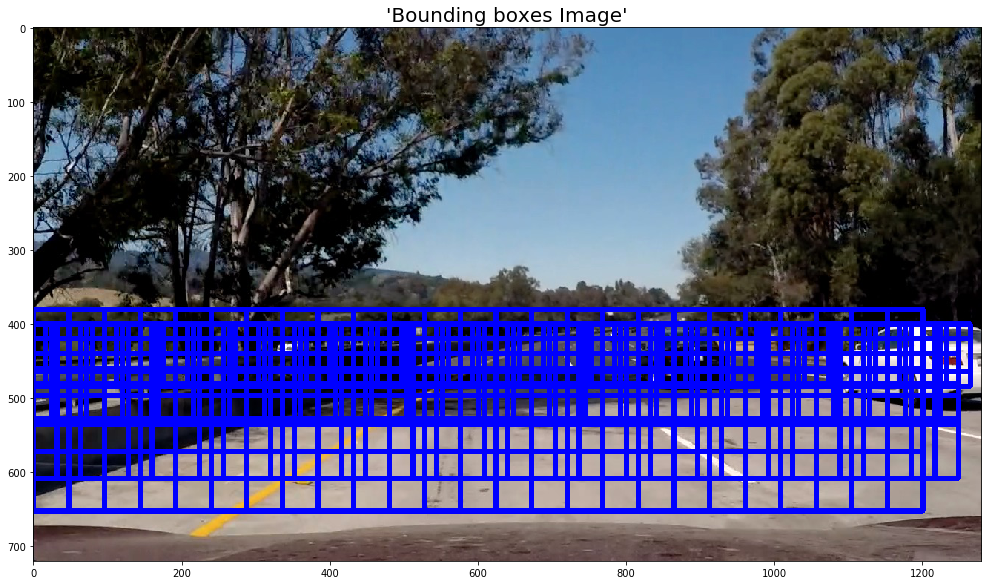

In [9]:
### Search for Cars using SLiding Window Approach ####################################

### Read a test image to search for cars
image = mpimg.imread(test_img_folder+'test5.jpg')
draw_image = np.copy(image)

DBG_SCALE = 0

# Define Scale and Window list for multi-scale window search
scount = 80
slist  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.0, 3.0]
wslist = [400, 420, 400, 440, 400, 480, 380, 460]
scwin_list = []
for i, scale in enumerate(slist):
    scwin_list.append(scale)
    wstart = wslist[i]
    wend = np.int(wslist[i] + scount*scale)
    scwin_list.append((wstart, wend))
print ('Scale_List: ', scwin_list)


if DBG_SCALE == 1:
    n = 6
    scale_list = scwin_list[2*n:2*n+2]
else:
    scale_list = scwin_list

print (scale_list)


# Load  the Trained classifier
print('*** Loading the SVC Training classifier data to svc_classifier')
svc, X_scaler = pickle.load(open("svc_classifier.p", "rb"))


DBG_CHECK = 0

if DBG_CHECK == 1:
    scale = 2.5
    ystart, ystop = 380, 380+200
# Search using the sliding window method extracting features(HOG, Spatial..) in each image
    on_windows, bboxes = find_cars (image, color_space, ystart, ystop, scale, svc, X_scaler, orient, \
                                pix_per_cell, cell_per_block, spatial_size, hist_bins)
else:
    on_windows, bboxes = sliding_windows_multiscale (image, color_space, scale_list, svc, X_scaler, orient, \
                                    pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
out_img = draw_boxes(draw_image, on_windows, color=(0, 0, 255), thick=6)    
window_img = draw_boxes(draw_image, bboxes, color=(0, 0, 255), thick=6)                    

# Plot the images
img_list =[window_img]
title_list = ['Bounding boxes Image']
cmap_gray =[0]
plot_images(img_list, cmap_gray, title_list, imgs_per_row=1, figsize=(24,8), \
            fname='sliding_windows')

C:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


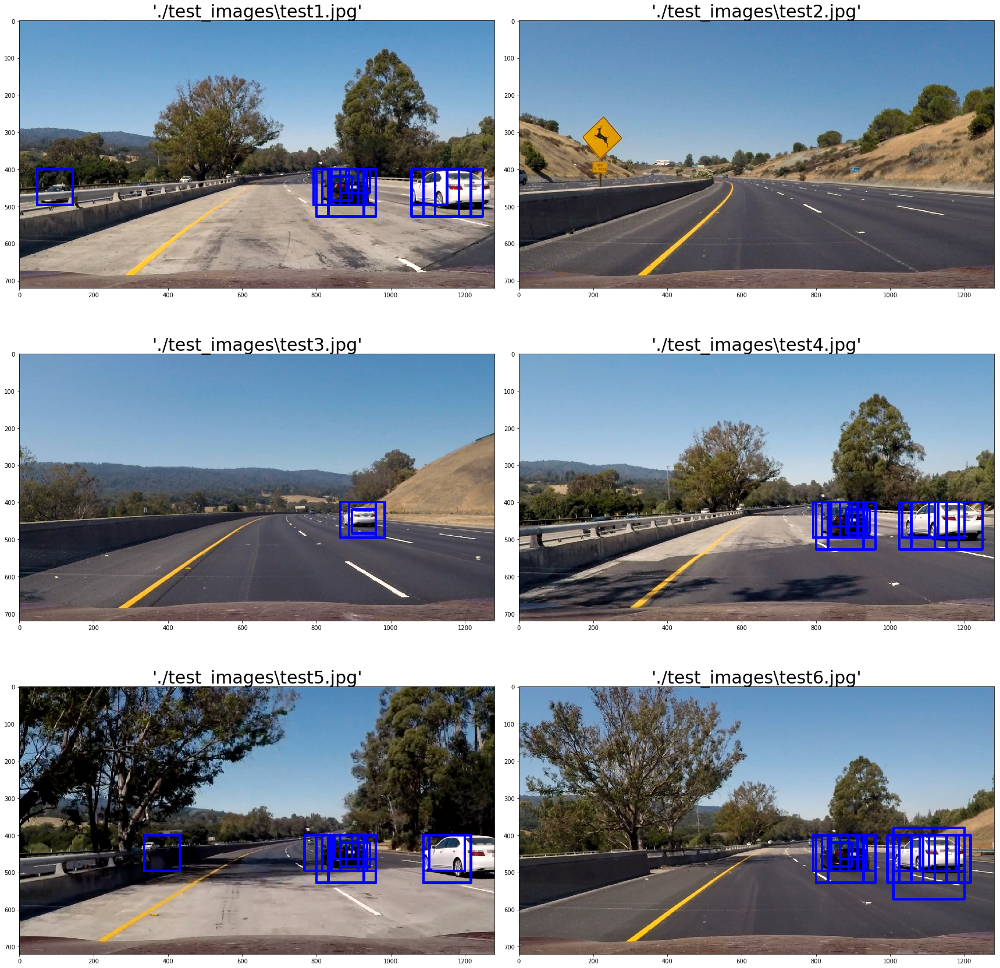

In [10]:
### Read a test image to search for cars
test_imgs = glob.glob(test_img_folder+'*.jpg')

# Apply Sliding window approach on the Test Images
img_list = []
cmap_gray = []
title_list = []

for img_file in test_imgs:
    image = mpimg.imread(img_file)
    draw_image = np.copy(image)
    on_windows, bboxes = sliding_windows_multiscale (image, color_space, scale_list, svc, X_scaler, orient, \
                                pix_per_cell, cell_per_block, spatial_size, hist_bins)

    out_img = draw_boxes(draw_image, on_windows, color=(0, 0, 255), thick=6)    
    #window_img = draw_boxes(draw_image, bboxes, color=(0, 0, 255), thick=6)   
    img_list.append(np.copy(out_img))
    title_list.append(img_file)
    cmap_gray.append(0)
 
# Plot the examples
#img_list =[window_img, out_img]
#title_list = ['Bounding boxes Image', 'On_Window Image']
#cmap_gray =[0,0]
plot_images(img_list, cmap_gray, title_list, top=0.7, imgs_per_row=2, \
            figsize=(24,24), fontsize=30, fname='car_detections')

C:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


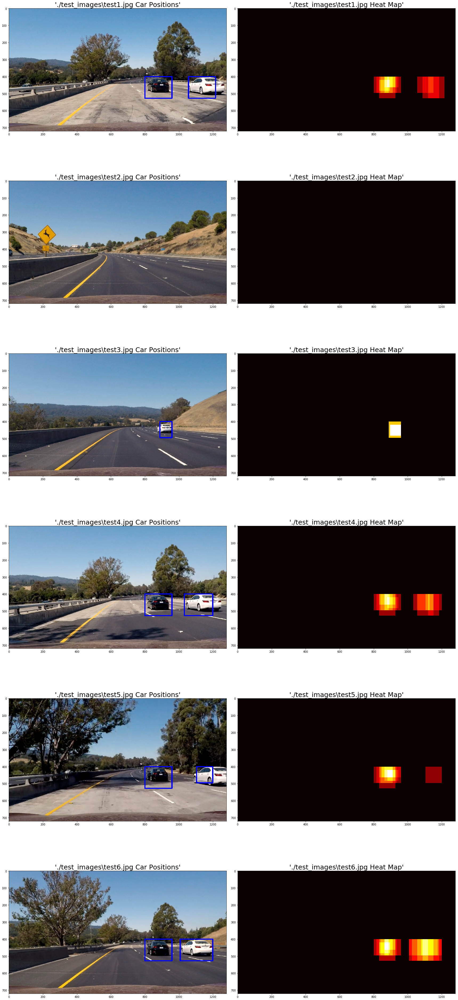

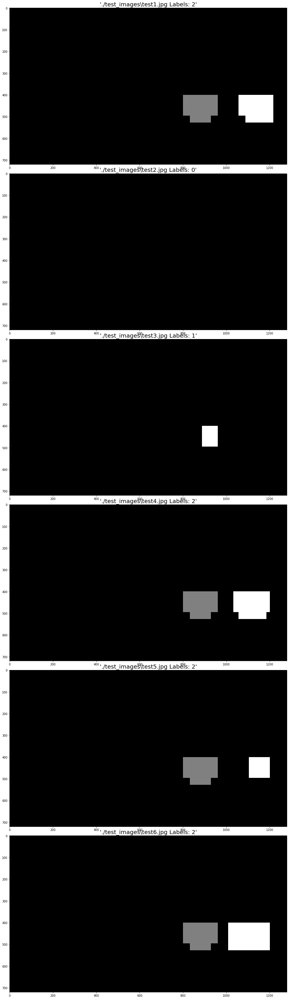

In [11]:
###### Adding HEAT MAP to the bounding box detections ##########################

# Apply Sliding window approach on the Test Images
img_list = []
cmap_gray = []
title_list = []
limg_list = []
lcmap_gray = []
ltitle_list = []

### Read a test image to search for cars
test_imgs = glob.glob(test_img_folder+'*.jpg')
test_image = test_img_folder+'test5.jpg'
#test_imgs = [test_image]

HEAT_THRESHOLD = 1

for img_file in test_imgs:
    image = mpimg.imread(img_file)
    draw_image = np.copy(image)
    on_windows, bboxes = sliding_windows_multiscale (image, color_space,scale_list, svc, X_scaler, orient, \
                                pix_per_cell, cell_per_block, spatial_size, hist_bins)

    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, on_windows)
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,HEAT_THRESHOLD)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    pos_img = draw_labeled_bboxes(draw_image, labels)

    # Append images for plotting
    img_list.append(pos_img)
    title_list.append(img_file + ' Car Positions')
    cmap_gray.append(0)
    img_list.append(np.copy(heatmap))
    title_list.append(img_file + ' Heat Map')
    cmap_gray.append(2)
    # Label Images
    limg_list.append(labels[0])
    ltitle_list.append(img_file + ' Labels: ' + str(labels[1]))
    lcmap_gray.append(1)

# Plot the Bounding boxes and Heat maps
plot_images(img_list, cmap_gray, title_list, top=0.8, imgs_per_row=2,\
            figsize=(24,54), fontsize=25, fname='bboxes_and_heat')

# Plot the label maps
plot_images(limg_list, lcmap_gray, ltitle_list, top=0.8, imgs_per_row=1,\
            figsize=(24,48), fontsize=20, fname='Labels')



In [12]:
### Process the Video

# Apply Sliding window approach on the Test Images
img_list = []
cmap_gray = []
title_list = []
fnumber = 0

# Load  the Trained classifier
print('*** Loading the SVC Training classifier data to svc_classifier')
svc, X_scaler = pickle.load(open("svc_classifier.p", "rb"))


### Class to store history of detections
class Car_Detect():
    def __init__(self, nframes):
        # Store previous car detections
        self.windows = [] 
        self.fnumber = 0
        self.store_frames = nframes
        self.first_window = None
        
    def update_windows (self, windows):
        self.first_window = None
        if len(windows) > 0:
            self.windows.append(windows)
            if len(self.windows) > self.store_frames:
                self.first_window = self.windows[0]
                self.windows = self.windows[1:]
        else: # Once no windows are found remove history
            self.windows = []
    def update_fnumber (self):
        self.fnumber = self.fnumber + 1   
         

### Set the detection type and frame number for plotting
# Define a class to store data from previous frames
store_for_frames = 6
DETECT_TYPE = 0
fstart = 0
fend = 0


def process_image(image):
    #cdet.update_fnumber()
    #print (cdet.fnumber)
    draw_image = np.copy(image)
    on_windows, bboxes = sliding_windows_multiscale (image, color_space,scale_list, svc, X_scaler, orient, \
                                pix_per_cell, cell_per_block, spatial_size, hist_bins)

    if DETECT_TYPE == 1:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        # Add heat to each box in box list
        heat = add_heat(heat, on_windows)
        # Apply threshold to help remove false positives
        heat = apply_threshold(heat,1)
        # Visualize the heatmap when displaying    
        heatmap = np.clip(heat, 0, 255)
        # Find final boxes from heatmap using label function
        labels = label(heatmap)
        pos_image = draw_labeled_bboxes(draw_image, labels)
        
    elif DETECT_TYPE == 2:
        # add detections to the history
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        if len(on_windows) > 0:
            cdet.update_windows(on_windows)
            for window in cdet.windows:
                heat = add_heat(heat, window)
            
        heat = apply_threshold(heat, 1 + len(cdet.windows)//2)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        pos_img = draw_labeled_bboxes(draw_image, labels)
        
    else:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        cdet.update_windows(on_windows)
        #if cdet.first_window is not None:
        #    heat = remove_heat(heat, cdet.first_window)
        for window in cdet.windows:
            heat = add_heat(heat, window)
                    
        heat = apply_threshold(heat, 1 + len(cdet.windows)//2)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        pos_img = draw_labeled_bboxes(draw_image, labels)  
        
    '''
    # Append images for plotting
    if cdet.fnumber >= fstart and cdet.fnumber <= fend:
        img_file = 'img' + str(cdet.fnumber)
        print ('Frame #: ', cdet.fnumber)
        window_img = draw_boxes(draw_image, on_windows, color=(0, 0, 255), thick=6) 
        img_list.append(np.copy(window_img))
        title_list.append(img_file + ' Bounding boxes')
        cmap_gray.append(0)
        img_list.append(np.copy(heatmap))
        title_list.append(img_file + ' Heat Map')
        cmap_gray.append(2)
    if cdet.fnumber == fend:
        # Plot the bounding boxes and heatmap images
        plot_images(img_list, cmap_gray, title_list, top=0.8, imgs_per_row=2,\
               figsize=(24,48), fontsize=25, fname='bboxes_and_heat')

        # Plot the Labels image
        limg_list = [np.copy(labels[0])]
        title = img_file + ' Labels Map'
        ltitle_list = [title]
        lcmap_gray = [1]
        plot_images(limg_list, lcmap_gray, ltitle_list, top=0.8, imgs_per_row=1,\
               figsize=(24,18), fontsize=25, fname='labels_map')
        
        # Plot the Labels image
        oimg_list = [np.copy(pos_img)]
        title = img_file + ' Labels Map'
        otitle_list = [title]
        ocmap_gray = [0]
        plot_images(oimg_list, ocmap_gray, otitle_list, top=0.8, imgs_per_row=1,\
               figsize=(24,18), fontsize=25, fname='output_bboxes')
    '''
    return pos_img


*** Loading the SVC Training classifier data to svc_classifier


In [13]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

cdet = Car_Detect(store_for_frames)
TEST_VIDEO = 0

if TEST_VIDEO == 1:
    test_out_file = 'test_video_out.mp4'
    clip_test = VideoFileClip('test_video.mp4')
else:
    test_out_file = 'project_video_out.mp4'
    clip_test = VideoFileClip('project_video.mp4')

clip_test_out = clip_test.fl_image(process_image)
%time clip_test_out.write_videofile(test_out_file, audio=False)


[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████▉| 1260/1261 [29:20<00:01,  1.38s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Wall time: 29min 22s
